In [1]:
!pip install opencv-python==4.10.0.84

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 9.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 5.0.0.93
    Uninstalling opencv-python-5.0.0.93:
      Successfully uninstalled opencv-python-5.0.0.93


In [2]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import zipfile

cv2.__version__

'4.10.0'

In [3]:
import tensorflow

tensorflow.__version__

'2.20.0'

In [4]:
from google.colab import drive

drive.mount("/content/gdrive")# monta uma pasta com o drive inteiro do content

Mounted at /content/gdrive


In [5]:
base_imgs = '/content/gdrive/MyDrive/LAMIA - Bootcamp/card23/data/data/fer2013/fer2013.csv'

In [6]:
data  = pd.read_csv(base_imgs)
# le o csv com todas as imagens e pixels
data.tail()

,emotion,pixels,Usage
35882,6,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...,PrivateTest
35883,3,178 174 172 173 181 188 191 194 196 199 200 20...,PrivateTest
35884,0,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...,PrivateTest
35885,3,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...,PrivateTest
35886,2,19 13 14 12 13 16 21 33 50 57 71 84 97 108 122...,PrivateTest


Text(0.5, 1.0, 'Imagens x emocoes')

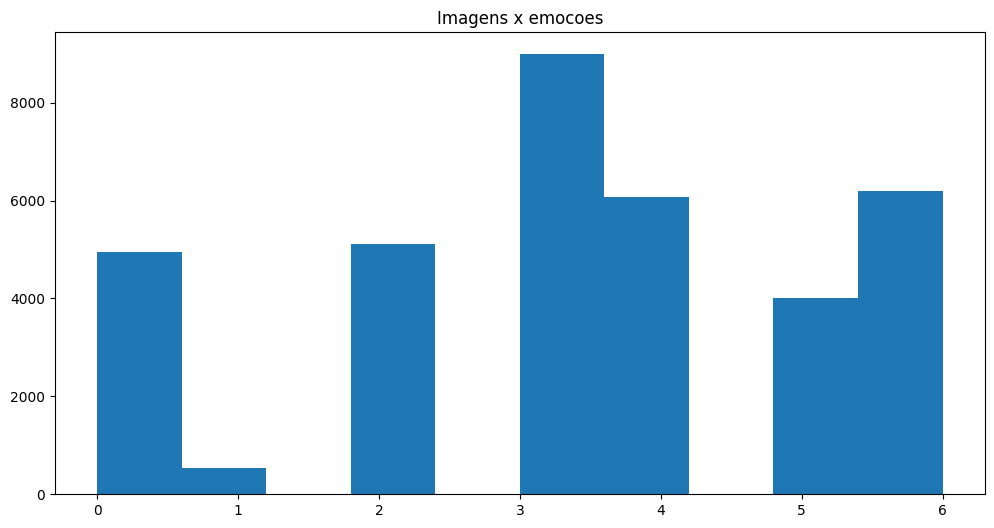

In [7]:
plt.figure(figsize=(12,6))
plt.hist(data['emotion'], bins = 10)
plt.title('Imagens x emocoes')
# mostra a quantidade de registros para cada classe


In [8]:
pixels = data['pixels'].tolist()
# passa os dados da coluna para lista
pixels

['70 80 82 72 58 58 60 63 54 58 60 48 89 115 121 119 115 110 98 91 84 84 90 99 110 126 143 153 158 171 169 172 169 165 129 110 113 107 95 79 66 62 56 57 61 52 43 41 65 61 58 57 56 69 75 70 65 56 54 105 146 154 151 151 155 155 150 147 147 148 152 158 164 172 177 182 186 189 188 190 188 180 167 116 95 103 97 77 72 62 55 58 54 56 52 44 50 43 54 64 63 71 68 64 52 66 119 156 161 164 163 164 167 168 170 174 175 176 178 179 183 187 190 195 197 198 197 198 195 191 190 145 86 100 90 65 57 60 54 51 41 49 56 47 38 44 63 55 46 52 54 55 83 138 157 158 165 168 172 171 173 176 179 179 180 182 185 187 189 189 192 197 200 199 196 198 200 198 197 177 91 87 96 58 58 59 51 42 37 41 47 45 37 35 36 30 41 47 59 94 141 159 161 161 164 170 171 172 176 178 179 182 183 183 187 189 192 192 194 195 200 200 199 199 200 201 197 193 111 71 108 69 55 61 51 42 43 56 54 44 24 29 31 45 61 72 100 136 150 159 163 162 163 170 172 171 174 177 177 180 187 186 187 189 192 192 194 195 196 197 199 200 201 200 197 201 137 58 98 9

In [9]:
largura, altura = 48,48
faces = []
amostras = 10
for i in pixels: # o loop vai tirar os espaços entre os dados da lista e depois coloca em um array numpy que a rede espera
  face = [int(pixel) for pixel in i.split(' ')]
  face = np.asarray(face).reshape(largura,altura)
  faces.append(face)

  if(amostras<10): # visualiza as 10 primeiras imagens
    cv2_imshow(face)
  amostras +=1

In [10]:
faces

[array([[ 70,  80,  82, ...,  52,  43,  41],
        [ 65,  61,  58, ...,  56,  52,  44],
        [ 50,  43,  54, ...,  49,  56,  47],
        ...,
        [ 91,  65,  42, ...,  72,  56,  43],
        [ 77,  82,  79, ..., 105,  70,  46],
        [ 77,  72,  84, ..., 106, 109,  82]]),
 array([[151, 150, 147, ..., 129, 140, 120],
        [151, 149, 149, ..., 122, 141, 137],
        [151, 151, 156, ..., 109, 123, 146],
        ...,
        [188, 188, 121, ..., 185, 185, 186],
        [188, 187, 196, ..., 186, 182, 187],
        [186, 184, 185, ..., 193, 183, 184]]),
 array([[231, 212, 156, ...,  44,  27,  16],
        [229, 175, 148, ...,  27,  35,  27],
        [214, 156, 157, ...,  28,  22,  28],
        ...,
        [241, 245, 250, ...,  57, 101, 146],
        [246, 250, 252, ...,  78, 105, 162],
        [250, 251, 250, ...,  88, 110, 152]]),
 array([[ 24,  32,  36, ..., 173, 172, 173],
        [ 25,  34,  29, ..., 173, 172, 173],
        [ 26,  29,  25, ..., 172, 172, 174],
        ..

In [11]:
print('Numero total de imagens: ', str(len(faces)))

Numero total de imagens:  35887


In [12]:
faces = np.asarray(faces)
# transforma faces em array, pois sem isso a lista faces vai ter arrays
# apos a transformaçaõ arrays dentro de um array numpy
faces.shape

(35887, 48, 48)

In [13]:
faces = np.expand_dims(faces,-1)
# adiciona uma dimensao para canal, pois o tensor precisa
faces.shape
# agora temos quantidade de imagens, altura, largura e canais

(35887, 48, 48, 1)

In [14]:
def normalizar(x):
  # funcao para normalizar os dados de pixels para 0-1
  x=x.astype('float32')
  x=x/255.0
  return x

In [15]:
faces = normalizar(faces)
faces[:1]

array([[[[0.27450982],
         [0.3137255 ],
         [0.32156864],
         ...,
         [0.20392157],
         [0.16862746],
         [0.16078432]],

        [[0.25490198],
         [0.23921569],
         [0.22745098],
         ...,
         [0.21960784],
         [0.20392157],
         [0.17254902]],

        [[0.19607843],
         [0.16862746],
         [0.21176471],
         ...,
         [0.19215687],
         [0.21960784],
         [0.18431373]],

        ...,

        [[0.35686275],
         [0.25490198],
         [0.16470589],
         ...,
         [0.28235295],
         [0.21960784],
         [0.16862746]],

        [[0.3019608 ],
         [0.32156864],
         [0.30980393],
         ...,
         [0.4117647 ],
         [0.27450982],
         [0.18039216]],

        [[0.3019608 ],
         [0.28235295],
         [0.32941177],
         ...,
         [0.41568628],
         [0.42745098],
         [0.32156864]]]], dtype=float32)

In [16]:
emocoes = pd.get_dummies(data['emotion']).values
# pega as emocoes e devolve em numpy array

In [17]:
emocoes[0]
# emocoes em umm array
# no video esta com numeros 1 para true e 0 para false entao faço uma correção
emocoes = emocoes.astype(int)

In [18]:
emocoes[0]

array([1, 0, 0, 0, 0, 0, 0])

In [19]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout,Activation,Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.models import model_from_json

In [20]:
x_train,x_test,y_train,y_test = train_test_split(faces, emocoes, test_size=0.1,random_state=42)
# faz a separação normal da base inteira para o treino da rede, definindo 10% para teste e o restante para treino
x_train, x_val,y_train,y_val = train_test_split(x_train,y_train, test_size=0.1,random_state=41)
# os dadas de validação sao tirados da separação de treino

In [21]:
print('numero de imagen treino', len(x_train))
print('numero de imagen test', len(x_test))
print('numero de imagen validacao', len(x_val))

numero de imagen treino 29068
numero de imagen test 3589
numero de imagen validacao 3230


In [22]:
np.save('mod_xtest',x_test)
np.save('mod_ytest',y_test)

In [23]:
num_features = 64 # numero de maps features, usado na convolução
labels = 7 # numero de features a serem previsas(as emocoes)
batch_size = 64 #quantos registros a rede vai treinar por vez,e depois de cada batch faz o ajuste dos pesos e retorna o loss
epochs = 100 # numero de vezes que a rede vai ser executada
width,height = 48,48 # tamanho da imagem, largura e altura de pixels

model = Sequential() # instancia o objeto Sequential

In [24]:
model.add(Conv2D(num_features,kernel_size=(3,3), activation='relu', input_shape=(width,height,1),data_format='channels_last', kernel_regularizer=l2(0.01)))
# convolução com 64 mapas de caracteristicas, um kernel de 3x3, dimensao de entrada com largura, altura e 1 canal de cor(cinza), kernel regularizaion penaliza os algum erros(mesmo sentdo do MSE mas agora aplicado a rede)

model.add(Conv2D(num_features,kernel_size=(3,3), activation='relu', padding='same'))
# com o padding, ao fazer ao passar o kernel para pegar as feature maps adiciona uma coluna a imagem(com 0s) para que nao seja descartado no caso de sobrar 1 ou 2 colunas, pois o kernel é 3 colunas entao se tivesse esssas duas possibilidades ele descartaria essas ultimas colunas

model.add(BatchNormalization())#aplica uma normalização

model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
# reduz os feature maps pegando de um kernel, dado seu tamnho 2x2 onde o valor maximo dentro desse kernel passa para uma matriz seguinte

model.add(Dropout(0.5))# zera o valor de 50% dos neuronios

model.add(Conv2D(2 * num_features,kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2 * num_features,kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Dropout(0.5))


model.add(Conv2D(2 * 2*  num_features,kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2 * 2 *num_features,kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Dropout(0.5))

model.add(Conv2D(2 * 2* 2 *num_features,kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2 * 2 * 2*num_features,kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Dropout(0.5))

model.add(Flatten())# transforma tudo em um vetor para dar entrada a rede neural

# agora vem a moldagem das camadas densas, sao as camadas que vao processar as imagens

model.add(Dense(2*2*2*num_features, activation='relu'))# 512 neuronios
model.add(Dropout(0.4))# desativa 40% dos neuronios
model.add(Dense(2*2*num_features, activation='relu'))#256 neuronios
model.add(Dropout(0.4))
model.add(Dense(2*num_features, activation='relu'))#128 neuronios
model.add(Dropout(0.5))
model.add(Dense(labels, activation='softmax'))# camada de saida, nessse caso sao 7 classes entao 7 saidas. A camada de saida se define pela funcao softmax que ira retornar a probabilidade de cada classe

model.summary()

/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 46, 46, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 46, 46, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 46, 46, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 23, 23, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 23, 23, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 23, 23, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 11, 11, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 11, 11, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 11, 11, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 11, 11, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 5, 5, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 5, 5, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 5, 5, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 5,905,863 (22.53 MB)

 Trainable params: 5,902,151 (22.51 MB)

 Non-trainable params: 3,712 (14.50 KB)

In [25]:
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7), metrics=['accuracy'])
# define os parametros de loss, o categorical crossentropy pois é o padrao utilizado para multiclasse
# o otimizador(que realmente vai fazer a aplicação para corrigir os erros) é o Adam(opt padrao), parametros com aprendizado é baixo justamente para a rede nao cair em overfitting

arquivo_modelo = 'modelo_01_expressoes.h5'
arquivo_modelo_json = 'modelo_01_expressoes.json'

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor = 0.9, patience=3, verbose = 1)
# essa funcao monitora caso a rede pare de aprender e nao consehuir mais ser eficiente. Verifica o val_loss para que se passe de 3 epochs e sem evolução entao ele tenta mudar o lr para melhorar a aprendizagem
early_stopper = EarlyStopping(monitor='val_loss', min_delta=0,patience=8,verbose=1,mode='auto')
# essa funcao para o treinamento do modelo caso nao tenha evolução no aprendizado apos 8 epochs. UMa função muito útil que evita ate o overfitting e a rede se degradar ao ajustar demais os pesos
check_pointer = ModelCheckpoint(arquivo_modelo, monitor='val_loss', verbose =1, save_best_only=True)
# salva o melhor modelo durante as epochs e sobreescreve caso um modelo posterior seja melhor

In [26]:
model_json = model.to_json()
# vai salvar a arquitetura da rede em formato json

with open(arquivo_modelo_json, 'w') as json_file:
    json_file.write(model_json)

In [27]:
history = model.fit(np.array(x_train),np.array(y_train), batch_size=batch_size, epochs=epochs,
                    verbose=1,validation_data=(np.array(x_val),np.array(y_val)),shuffle=True,
                    callbacks=[lr_reducer,early_stopper,check_pointer])

# treina o modelo com todas as funcoes e parametros ja definidos

Epoch 1/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.1894 - loss: 2.3098
Epoch 1: val_loss improved from None to 1.81591, saving model to modelo_01_expressoes.h5



Epoch 1: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - accuracy: 0.2095 - loss: 1.9962 - val_accuracy: 0.2594 - val_loss: 1.8159 - learning_rate: 0.0010
Epoch 2/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.2495 - loss: 1.8369
Epoch 2: val_loss improved from 1.81591 to 1.79549, saving model to modelo_01_expressoes.h5



Epoch 2: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step - accuracy: 0.2458 - loss: 1.8339 - val_accuracy: 0.2594 - val_loss: 1.7955 - learning_rate: 0.0010
Epoch 3/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.2455 - loss: 1.8194
Epoch 3: val_loss did not improve from 1.79549
455/455 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step - accuracy: 0.2533 - loss: 1.8065 - val_accuracy: 0.2607 - val_loss: 1.9164 - learning_rate: 0.0010
Epoch 4/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.2998 - loss: 1.7475
Epoch 4: val_loss improved from 1.79549 to 1.65772, saving model to modelo_01_expressoes.h5



Epoch 4: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.3118 - loss: 1.7151 - val_accuracy: 0.3291 - val_loss: 1.6577 - learning_rate: 0.0010
Epoch 5/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.3537 - loss: 1.6292
Epoch 5: val_loss improved from 1.65772 to 1.59273, saving model to modelo_01_expressoes.h5



Epoch 5: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - accuracy: 0.3658 - loss: 1.6058 - val_accuracy: 0.3759 - val_loss: 1.5927 - learning_rate: 0.0010
Epoch 6/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.3990 - loss: 1.5243
Epoch 6: val_loss improved from 1.59273 to 1.49364, saving model to modelo_01_expressoes.h5



Epoch 6: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.4012 - loss: 1.5169 - val_accuracy: 0.3991 - val_loss: 1.4936 - learning_rate: 0.0010
Epoch 7/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.4279 - loss: 1.4556
Epoch 7: val_loss improved from 1.49364 to 1.39151, saving model to modelo_01_expressoes.h5



Epoch 7: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.4279 - loss: 1.4489 - val_accuracy: 0.4619 - val_loss: 1.3915 - learning_rate: 0.0010
Epoch 8/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.4517 - loss: 1.4200
Epoch 8: val_loss did not improve from 1.39151
455/455 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - accuracy: 0.4541 - loss: 1.4105 - val_accuracy: 0.4260 - val_loss: 1.4434 - learning_rate: 0.0010
Epoch 9/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.4715 - loss: 1.3710
Epoch 9: val_loss improved from 1.39151 to 1.32872, saving model to modelo_01_expressoes.h5



Epoch 9: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.4764 - loss: 1.3675 - val_accuracy: 0.5099 - val_loss: 1.3287 - learning_rate: 0.0010
Epoch 10/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.4993 - loss: 1.3285
Epoch 10: val_loss improved from 1.32872 to 1.24830, saving model to modelo_01_expressoes.h5



Epoch 10: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.4984 - loss: 1.3295 - val_accuracy: 0.5118 - val_loss: 1.2483 - learning_rate: 0.0010
Epoch 11/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.5082 - loss: 1.3070
Epoch 11: val_loss improved from 1.24830 to 1.20838, saving model to modelo_01_expressoes.h5



Epoch 11: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - accuracy: 0.5084 - loss: 1.3025 - val_accuracy: 0.5483 - val_loss: 1.2084 - learning_rate: 0.0010
Epoch 12/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5275 - loss: 1.2735
Epoch 12: val_loss did not improve from 1.20838
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.5274 - loss: 1.2736 - val_accuracy: 0.5353 - val_loss: 1.2666 - learning_rate: 0.0010
Epoch 13/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5352 - loss: 1.2415
Epoch 13: val_loss improved from 1.20838 to 1.17924, saving model to modelo_01_expressoes.h5



Epoch 13: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.5387 - loss: 1.2375 - val_accuracy: 0.5663 - val_loss: 1.1792 - learning_rate: 0.0010
Epoch 14/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5483 - loss: 1.2091
Epoch 14: val_loss improved from 1.17924 to 1.15322, saving model to modelo_01_expressoes.h5



Epoch 14: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.5532 - loss: 1.2145 - val_accuracy: 0.5687 - val_loss: 1.1532 - learning_rate: 0.0010
Epoch 15/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5661 - loss: 1.1882
Epoch 15: val_loss did not improve from 1.15322
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.5654 - loss: 1.1892 - val_accuracy: 0.5480 - val_loss: 1.2229 - learning_rate: 0.0010
Epoch 16/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5767 - loss: 1.1664
Epoch 16: val_loss improved from 1.15322 to 1.14394, saving model to modelo_01_expressoes.h5



Epoch 16: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.5754 - loss: 1.1640 - val_accuracy: 0.5768 - val_loss: 1.1439 - learning_rate: 0.0010
Epoch 17/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.5817 - loss: 1.1385
Epoch 17: val_loss did not improve from 1.14394
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.5817 - loss: 1.1351 - val_accuracy: 0.5777 - val_loss: 1.1498 - learning_rate: 0.0010
Epoch 18/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.5944 - loss: 1.1038
Epoch 18: val_loss improved from 1.14394 to 1.08089, saving model to modelo_01_expressoes.h5



Epoch 18: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.5910 - loss: 1.1140 - val_accuracy: 0.6009 - val_loss: 1.0809 - learning_rate: 0.0010
Epoch 19/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.5977 - loss: 1.0998
Epoch 19: val_loss improved from 1.08089 to 1.07769, saving model to modelo_01_expressoes.h5



Epoch 19: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.5975 - loss: 1.1014 - val_accuracy: 0.6127 - val_loss: 1.0777 - learning_rate: 0.0010
Epoch 20/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6054 - loss: 1.0613
Epoch 20: val_loss improved from 1.07769 to 1.07733, saving model to modelo_01_expressoes.h5



Epoch 20: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.6071 - loss: 1.0755 - val_accuracy: 0.6050 - val_loss: 1.0773 - learning_rate: 0.0010
Epoch 21/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6169 - loss: 1.0447
Epoch 21: val_loss did not improve from 1.07733
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.6128 - loss: 1.0511 - val_accuracy: 0.5656 - val_loss: 1.1463 - learning_rate: 0.0010
Epoch 22/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6266 - loss: 1.0218
Epoch 22: val_loss did not improve from 1.07733
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.6252 - loss: 1.0303 - val_accuracy: 0.5954 - val_loss: 1.1001 - learning_rate: 0.0010
Epoch 23/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6366 - loss: 1.0091
Epoch 23: ReduceLROnPlateau reducing learning rate to 0.0009000000427477062.

Epoch 23: val_loss did not improve from 1.07733
455/455 ━━━━━━━━━━━━━━


Epoch 24: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.6414 - loss: 0.9857 - val_accuracy: 0.6198 - val_loss: 1.0392 - learning_rate: 9.0000e-04
Epoch 25/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6533 - loss: 0.9593
Epoch 25: val_loss did not improve from 1.03920
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.6511 - loss: 0.9645 - val_accuracy: 0.6068 - val_loss: 1.0873 - learning_rate: 9.0000e-04
Epoch 26/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.6627 - loss: 0.9336
Epoch 26: val_loss did not improve from 1.03920
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.6557 - loss: 0.9454 - val_accuracy: 0.6248 - val_loss: 1.0429 - learning_rate: 9.0000e-04
Epoch 27/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6665 - loss: 0.9140
Epoch 27: val_loss improved from 1.03920 to 1.02377, saving model to modelo_01_expressoes.h5



Epoch 27: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.6620 - loss: 0.9243 - val_accuracy: 0.6362 - val_loss: 1.0238 - learning_rate: 9.0000e-04
Epoch 28/100
455/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6780 - loss: 0.8998
Epoch 28: val_loss did not improve from 1.02377
455/455 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.6719 - loss: 0.9109 - val_accuracy: 0.6378 - val_loss: 1.0301 - learning_rate: 9.0000e-04
Epoch 29/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6826 - loss: 0.8766
Epoch 29: val_loss improved from 1.02377 to 1.00290, saving model to modelo_01_expressoes.h5



Epoch 29: finished saving model to modelo_01_expressoes.h5
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.6798 - loss: 0.8848 - val_accuracy: 0.6399 - val_loss: 1.0029 - learning_rate: 9.0000e-04
Epoch 30/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6953 - loss: 0.8478
Epoch 30: val_loss did not improve from 1.00290
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.6871 - loss: 0.8636 - val_accuracy: 0.6424 - val_loss: 1.0318 - learning_rate: 9.0000e-04
Epoch 31/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6944 - loss: 0.8466
Epoch 31: val_loss did not improve from 1.00290
455/455 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step - accuracy: 0.6891 - loss: 0.8535 - val_accuracy: 0.6319 - val_loss: 1.0346 - learning_rate: 9.0000e-04
Epoch 32/100
454/455 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.6996 - loss: 0.8415
Epoch 32: ReduceLROnPlateau reducing learning rate to 0.0008100000384729356.

Epoch 32: val_loss did not improve from 1.00290
455/455 ━━

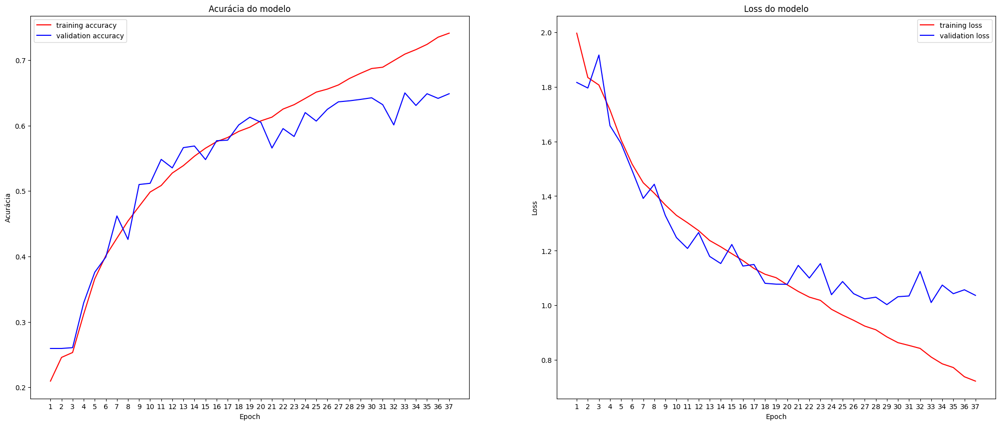

In [28]:
# graficos vao mostrar a acuracia no treino e na vlidacao ao longo das epocas
# mostra o loss de treino e validacao ao longo das epocas

def plota_historico_modelo(historico_modelo):
    fig, axs = plt.subplots(1, 2, figsize=(25,10))
    axs[0].plot(range(1, len(historico_modelo.history['accuracy']) + 1), historico_modelo.history['accuracy'], 'r')
    axs[0].plot(range(1, len(historico_modelo.history['val_accuracy']) + 1), historico_modelo.history['val_accuracy'], 'b')
    axs[0].set_title('Acurácia do modelo')
    axs[0].set_ylabel('Acurácia')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.arange(1, len(historico_modelo.history['accuracy']) + 1))
    axs[0].legend(['training accuracy', 'validation accuracy'], loc = 'best')

    axs[1].plot(range(1, len(historico_modelo.history['loss']) + 1), historico_modelo.history['loss'], 'r')
    axs[1].plot(range(1, len(historico_modelo.history['val_loss']) + 1), historico_modelo.history['val_loss'], 'b')
    axs[1].set_title('Loss do modelo')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.arange(1, len(historico_modelo.history['loss']) + 1))
    axs[1].legend(['training loss', 'validation loss'], loc = 'best')
    fig.savefig('historico_modelo_mod01.png')

plota_historico_modelo(history)

In [29]:
scores = model.evaluate(np.array(x_test),np.array(y_test),batch_size=batch_size)
# valida a acuracia real do modelo com os dados de teste

57/57 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.6369 - loss: 1.0613


In [30]:
scores

[1.061252236366272, 0.6369462013244629]

In [31]:
true_y=[]
pred_y=[]
x = np.load('mod_xtest.npy')
# carrega os arrays numpy salvos
y=np.load('mod_ytest.npy')

In [32]:
x[0]

array([[[0.5568628 ],
        [0.5803922 ],
        [0.59607846],
        ...,
        [0.3529412 ],
        [0.3529412 ],
        [0.3647059 ]],

       [[0.5568628 ],
        [0.5764706 ],
        [0.5921569 ],
        ...,
        [0.33333334],
        [0.36078432],
        [0.40392157]],

       [[0.5529412 ],
        [0.5686275 ],
        [0.5921569 ],
        ...,
        [0.3372549 ],
        [0.32156864],
        [0.37254903]],

       ...,

       [[0.0627451 ],
        [0.08235294],
        [0.07058824],
        ...,
        [0.08235294],
        [0.09019608],
        [0.11372549]],

       [[0.05490196],
        [0.0627451 ],
        [0.05490196],
        ...,
        [0.07450981],
        [0.07843138],
        [0.09803922]],

       [[0.04705882],
        [0.04705882],
        [0.04705882],
        ...,
        [0.06666667],
        [0.07450981],
        [0.09411765]]], dtype=float32)

In [33]:
y[0]

array([0, 0, 0, 1, 0, 0, 0])

In [34]:
json_file = open(arquivo_modelo_json, 'r')
loaded_model_json = json_file.read()
# carrega a arquitetura da rede salvo em json
json_file.close()

In [35]:
loaded_model = model_from_json(loaded_model_json)
# carrega o modelo
loaded_model.load_weights(arquivo_modelo)

In [36]:
y_pred = loaded_model.predict(x)
# faz a predicao com o modelo carregado

113/113 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step


In [37]:
yp = y_pred.tolist()
yt = y.tolist()
count =0

In [38]:
len(y)

3589

In [39]:
for i in range(len(y)):# calculo manual da acuracia que sera usada na matriz de confusao
  yy = max(yp[i])
  yyt = max(yt[i])
  pred_y.append(yp[i].index(yy))
  true_y.append(yt[i].index(yyt))
  if yp[i].index(yy) == (yt[i].index(yyt)):
    count+=1
acc = (count / len(y))*100

In [40]:
np.save('truey_mod01', true_y)
np.save('predy_mod01', pred_y)

In [41]:
from sklearn.metrics import confusion_matrix

In [42]:
y_true = np.load('truey_mod01.npy')
y_pred = np.load('predy_mod01.npy')

In [43]:
cm= confusion_matrix(y_true,y_pred)# cria a matriz de confusao com os dados previstos e os reais
expressoes = ['Raiva', 'Nojo', 'Medo', 'Feliz', 'Triste', 'Surpreso', 'Neutro']
titulo = 'Matriz de Confusão'
print(cm)

[[223   4  47  27 101   9  87]
 [ 19  11  12   1   8   0   1]
 [ 50   6 203  27 146  51  62]
 [ 18   0   8 769  22   7  57]
 [ 33   0  50  30 338   1 136]
 [  9   0  58  48   6 278  15]
 [ 24   0  23  38  96  11 419]]


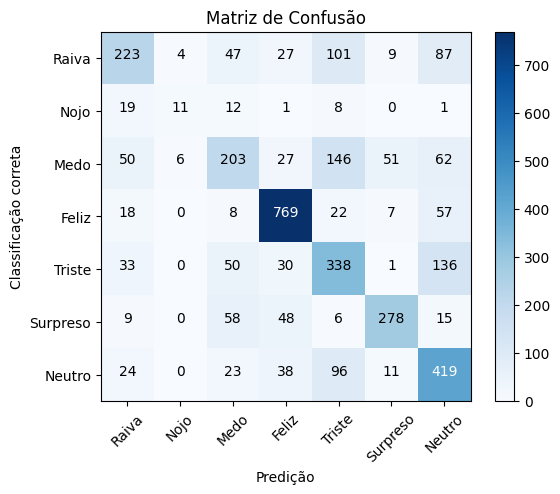

In [44]:
import itertools# aqui é somente colcoado a matriz de confusao em uma forma mais visivel
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title(titulo)
plt.colorbar()
tick_marks = np.arange(len(expressoes))
plt.xticks(tick_marks, expressoes, rotation = 45)
plt.yticks(tick_marks, expressoes)
fmt = 'd'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt), horizontalalignment='center', color='white' if cm[i,j] > thresh else 'black')

plt.ylabel('Classificação correta')
plt.xlabel('Predição')
plt.savefig('matriz_confusao_mod01.png')

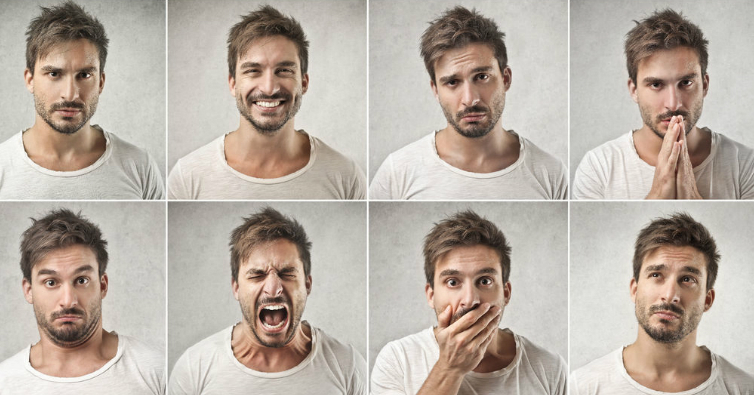

In [45]:
imagem = cv2.imread('/content/gdrive/MyDrive/LAMIA - Bootcamp/card23/data/data/Material/Material/testes/teste02.jpg')
# le uma imagem de teste
cv2_imshow(imagem)

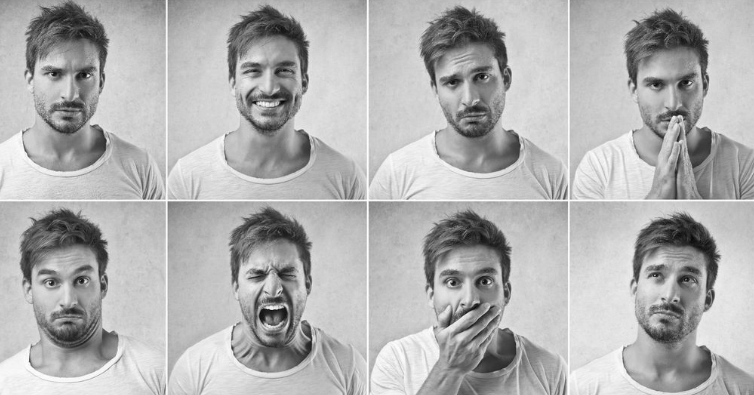

In [46]:
original = imagem.copy()
gray = cv2.cvtColor(original,cv2.COLOR_BGR2GRAY)
# transforma a imagem em cinza
cv2_imshow(gray)

In [47]:
face_cascade = cv2.CascadeClassifier('/content/gdrive/MyDrive/LAMIA - Bootcamp/card23/data/data/Material/Material/haarcascade_frontalface_default.xml')
face = face_cascade.detectMultiScale(gray,1.1,3)


In [48]:
face

array([[625,  49,  91,  91],
       [224,  35,  90,  90],
       [ 23,  41,  92,  92],
       [420,  43,  97,  97],
       [420, 242,  97,  97],
       [ 18, 243,  98,  98],
       [229, 242,  85,  85],
       [627, 241,  91,  91]], dtype=int32)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


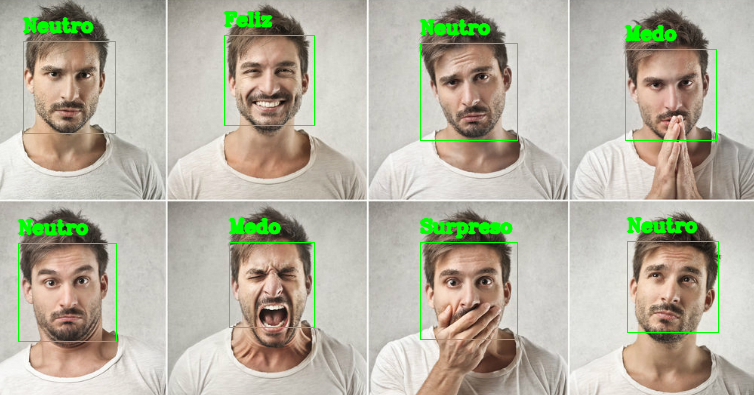

In [49]:
for (x,y,w,h) in face: # coloca a previsao em cima da caixa que indica o ROI da face
  cv2.rectangle(original, (x,y), (x+w, y+h), (0, 255,0), 1)
  roi_gray = gray[y:y+h, x:x + w]
  roi_gray = roi_gray.astype('float') / 255.0
  cropped_img = np.expand_dims(np.expand_dims(cv2.resize(roi_gray, (48,48)), -1), 0)
  prediction = loaded_model.predict(cropped_img)[0]
  cv2.putText(original,expressoes[int(np.argmax(prediction))], (x,y - 10), cv2.FONT_HERSHEY_COMPLEX, 0.6,(0,255,0),2, cv2.LINE_AA)

cv2_imshow(original)